In [3]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import Table

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_magnitudes, determine_fwhm
from plotting import show_image

# short exptime images: 5 # long exptime images: 5


Text(0.5, 1.0, '2023-09-05_HIP75458_H-alpha_40.0s_long_short_10_images_stacked_1')

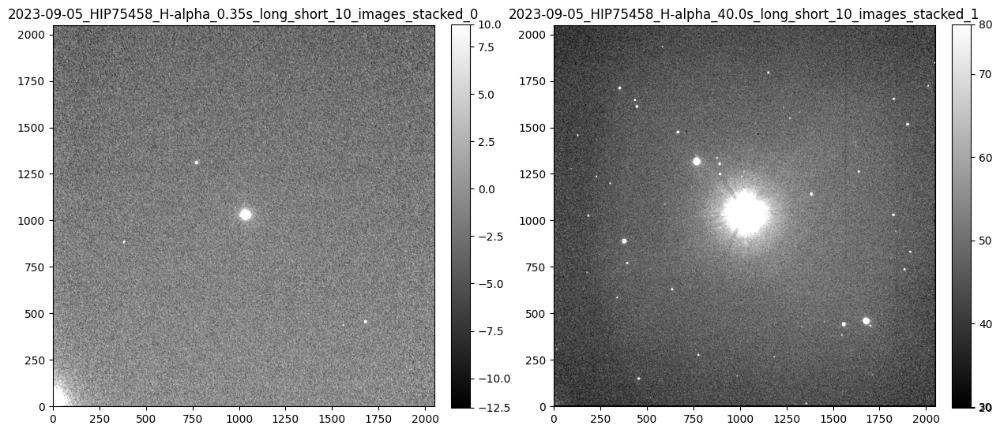

In [4]:
path_short= '/home/finn/visual_Studio_Code/data/2023-09-05/stacked/lightCor_HIP75458_H-alpha_0.35s_long_short_10_images_stacked_'
path_long = '/home/finn/visual_Studio_Code/data/2023-09-05/stacked/lightCor_HIP75458_H-alpha_40.0s_long_short_10_images_stacked_'

image_list_short = []
titles_short = []
image_list_long = []
titles_long = []

for fits_path in glob.glob(os.path.join(path_short + '*fit')):
    with fits.open(fits_path) as hdul:
        image_list_short.append(hdul[0].data)
        exptime1 = hdul[0].header["EXPTIME"]
        titles_short.append(hdul[0].header['DATE-OBS'][:10] + os.path.splitext(os.path.basename(fits_path))[0][8:]) #date + filename

for fits_path in glob.glob(os.path.join(path_long + '*fit')):
    with fits.open(fits_path) as hdul:
        image_list_long.append(hdul[0].data)
        exptime2 = hdul[0].header["EXPTIME"]
        titles_long.append(hdul[0].header['DATE-OBS'][:10] + os.path.splitext(os.path.basename(fits_path))[0][8:]) #date + filename

print("# short exptime images:",len(image_list_short), "# long exptime images:", len(image_list_long))
fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_list_short[0], fig=fig, ax=ax[0])
show_image(image_list_long[0] , fig=fig, ax=ax[1])
ax[0].set_title(titles_short[0])
ax[1].set_title(titles_long[0])

# Bright source

[-16.44067736830271, -16.427343578993682, -16.472642708045743, -16.441103349147458, -16.444366055030507]
0.014898876903718177


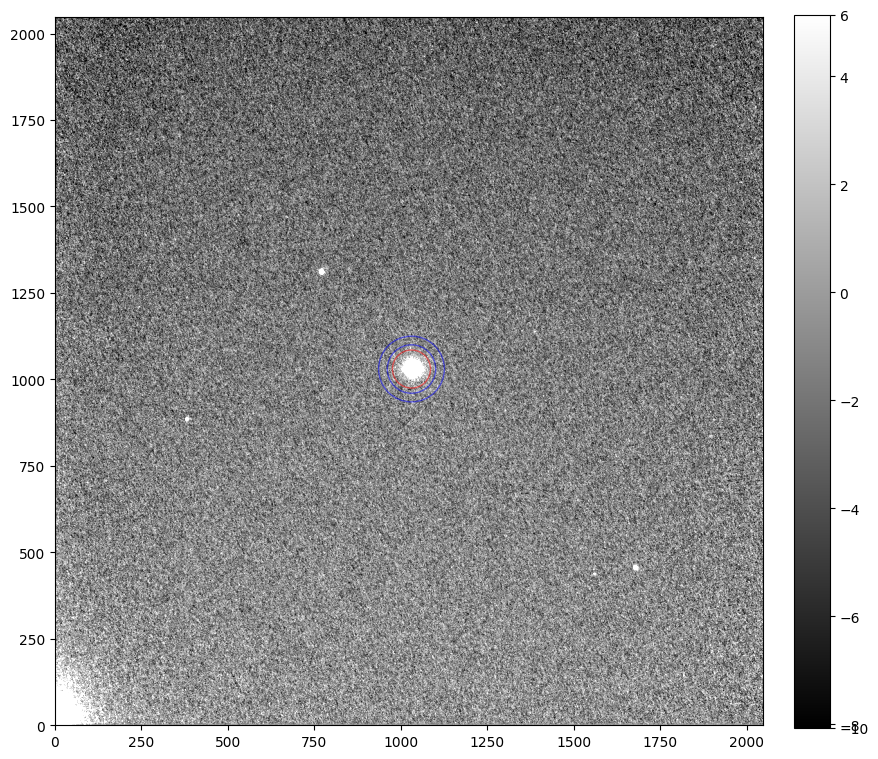

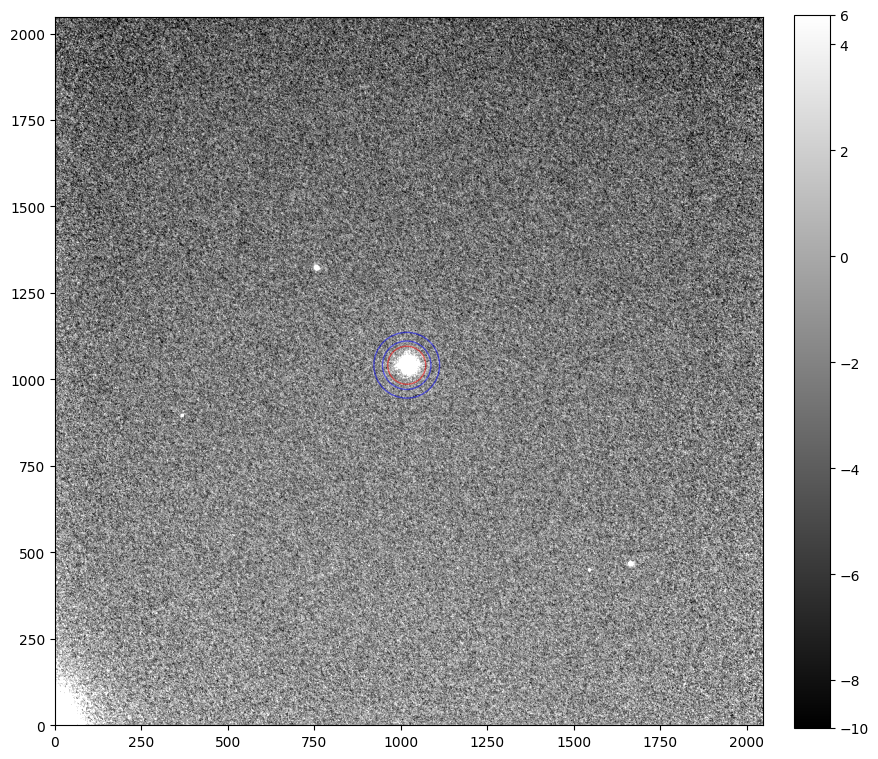

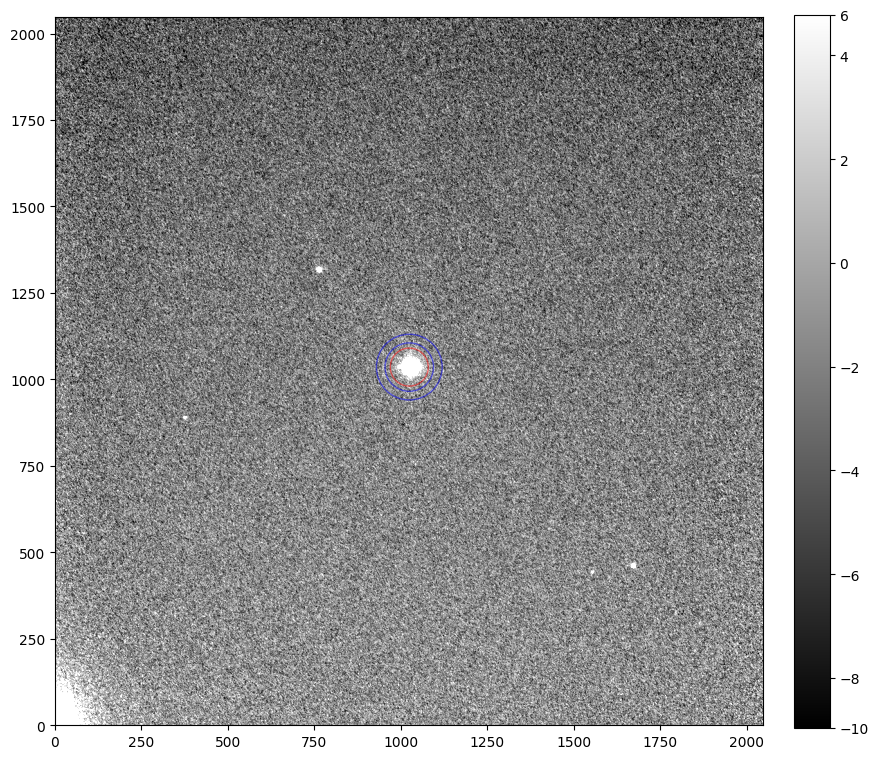

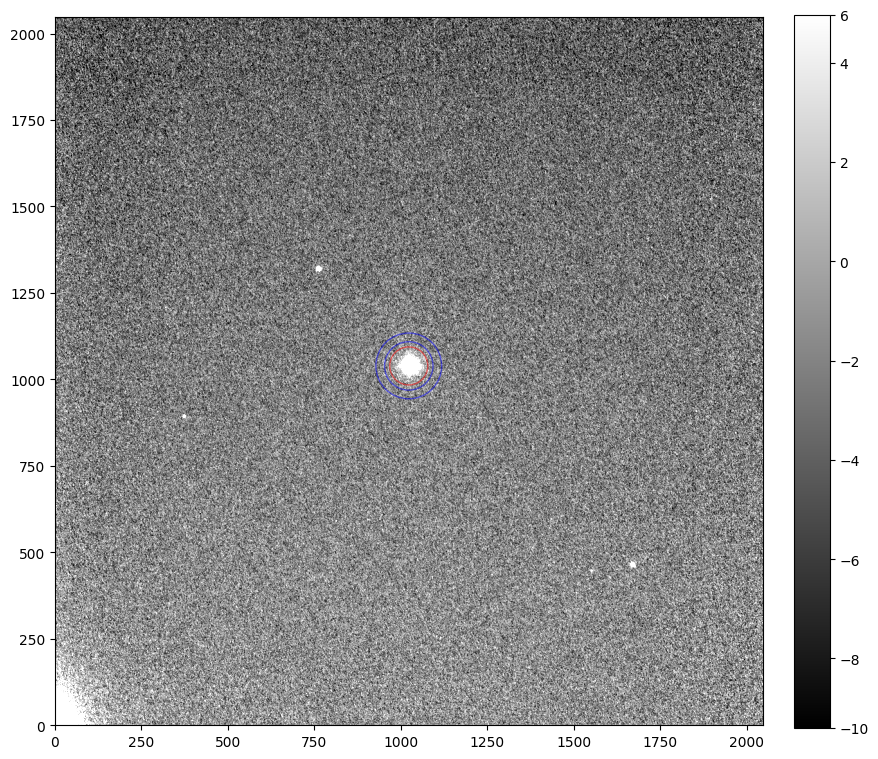

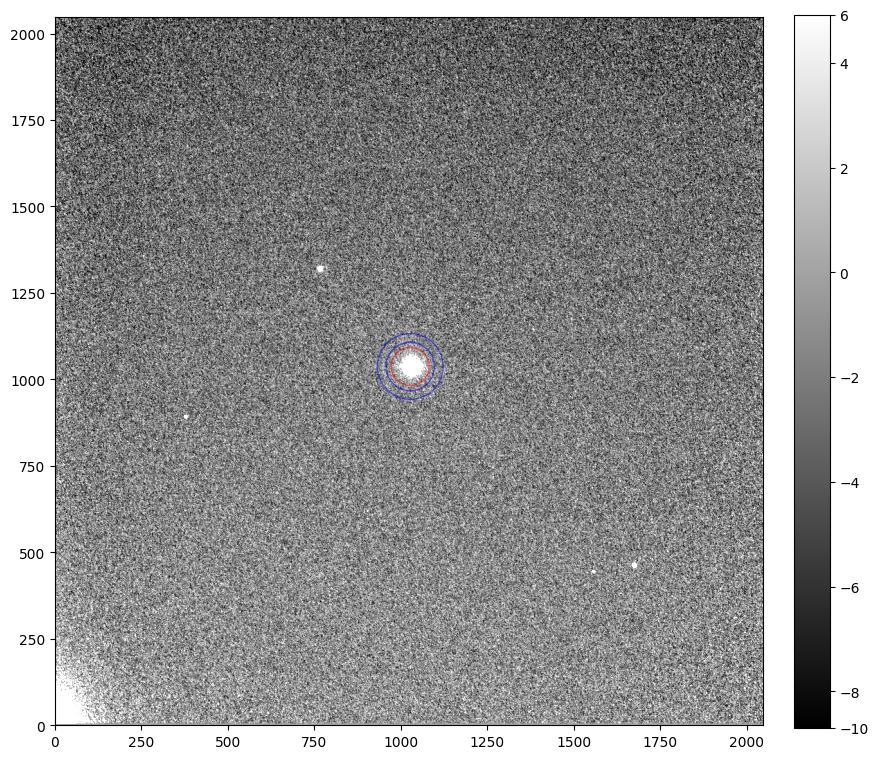

In [5]:
#### for bright star
mask = np.zeros(image_list_long[0].shape, dtype=bool)
mask[1900:2048, 0:200] = True #for newer pictures
#mask[0:100,0:100]=True
position_bright = []
magnitude_list_bright = []


for index, image in enumerate(image_list_short):

    mean, median, std = sigma_clipped_stats(image, sigma=3.0)
    daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-1.0, roundhi=1.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
    sources = daofind(image, mask=mask)
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    radius_bright = 55
    aperture_bright = CircularAperture(positions, r=radius_bright)
    annulus_aperture_bright = CircularAnnulus(positions, r_in=radius_bright+15, r_out=radius_bright+40)

    show_image(image)
    aperture_bright.plot(color='red', lw=1.0, alpha=0.5);
    annulus_aperture_bright.plot(color="blue", lw=1.0, alpha=0.5);

    phot_table_bright = aperture_photometry(image, aperture_bright, method='subpixel', subpixels=5)
    aperstats = ApertureStats(image, annulus_aperture_bright)
    bkg_mean = aperstats.mean #mean or median ????????????????????????????????????????
    aperture_area = aperture_bright.area_overlap(image)
    total_bkg = bkg_mean * aperture_area
    phot_table_bright['total_bkg'] = total_bkg

    for line in phot_table_bright:
      magnitude_bright = - (2.5*np.log10(abs(line[3]-line[4])/exptime1)) #M = zeropoint - 2.5*log10((flux-background)/exptime)
    #phot_table_bright['magnitude'] = magnitude_bright
    #phot_table_bright.pprint(max_lines = -1, max_width = -1)
    magnitude_list_bright.append(magnitude_bright)
position_bright.append(positions)

print(magnitude_list_bright)
print(np.std(magnitude_list_bright))

# Shift for faint source

In [6]:
#use middle index
shifts_long = determine_shift(image_list_long)
shifts_short = determine_shift(image_list_short)

shifts = []
for i in range(len(shifts_long)):
    mean_shift_x = (shifts_long[i][0] + shifts_short[i][0]) / 2.0
    mean_shift_y = (shifts_long[i][1] + shifts_short[i][1]) / 2.0
    shifts.append((mean_shift_x, mean_shift_y))

print(shifts_long)
print(shifts_short)
print(shifts)

Number of images to process: 5
we use image:  2 from given list as reference image
Number of images to process: 5
we use image:  2 from given list as reference image
[(2.7681828, -1.026591), (5.1504927, -7.0955815), (0, 0), (-7.227511, 5.1238475), (-3.2197669, 1.9403596)]
[(6.4728966, -5.517984), (-7.4980383, 5.5800014), (0, 0), (-1.6282355, 3.5063462), (2.810211, 1.7898301)]
[(4.620539665222168, -3.272287368774414), (-1.1737728118896484, -0.7577900886535645), (0.0, 0.0), (-4.427873134613037, 4.315096855163574), (-0.20477795600891113, 1.8650949001312256)]


for image 0 : (4.620539665222168, -3.272287368774414)
for image 1 : (-1.1737728118896484, -0.7577900886535645)
for image 2 : (0.0, 0.0)
for image 3 : (-4.427873134613037, 4.315096855163574)
for image 4 : (-0.20477795600891113, 1.8650949001312256)


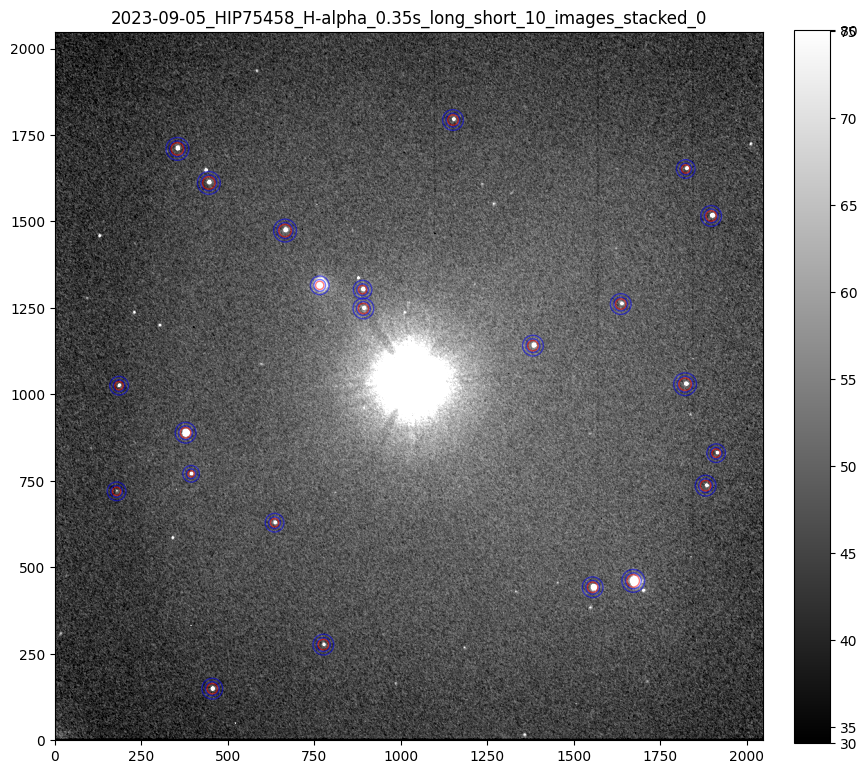

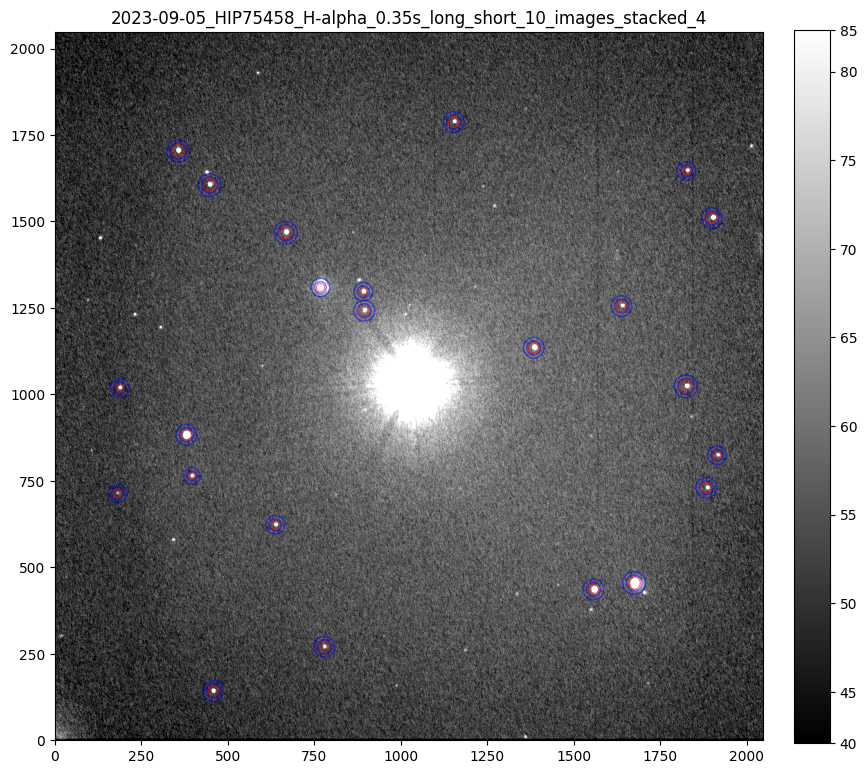

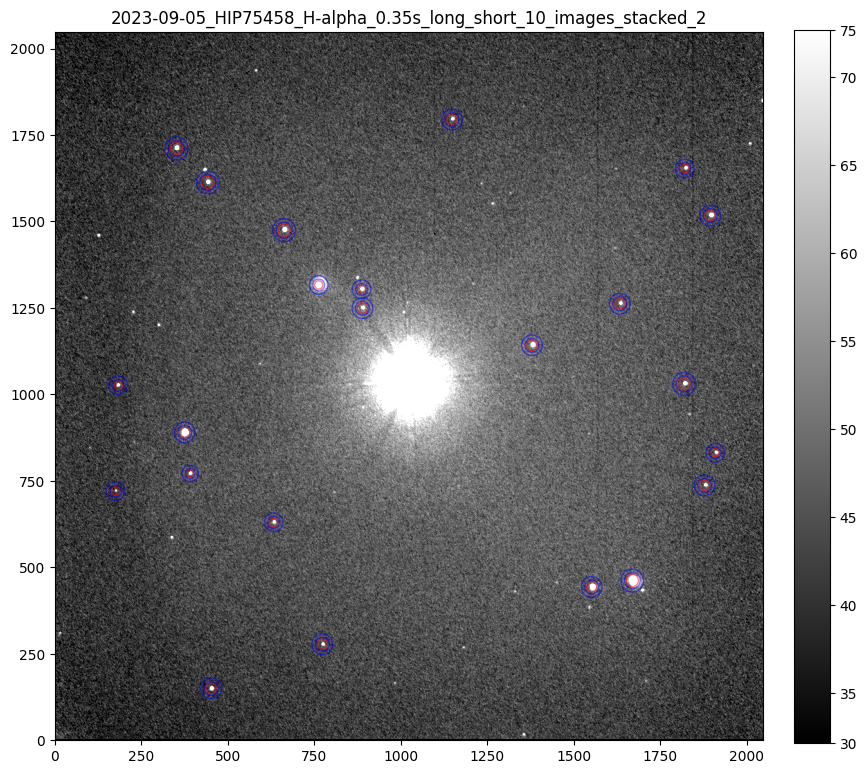

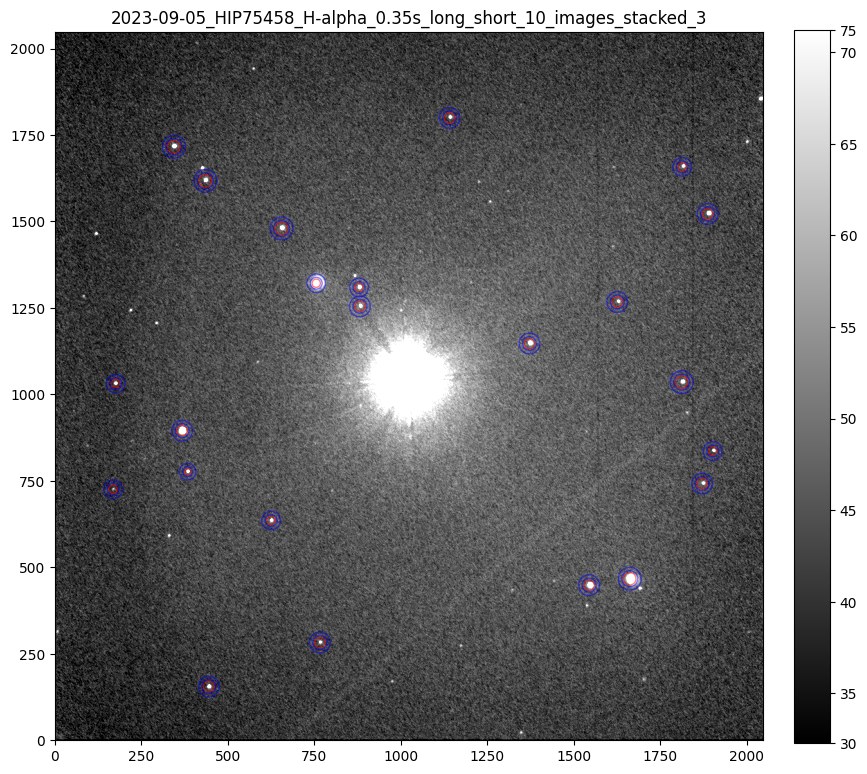

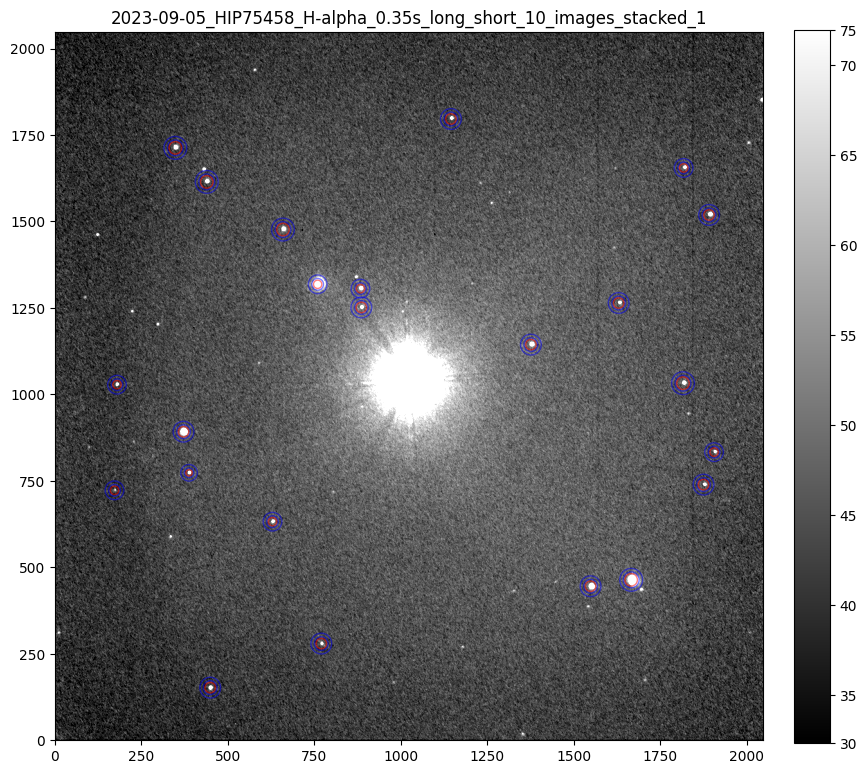

In [12]:
middle_index = len(image_list_long)//2
image = image_list_long[middle_index] #use as reference image because shifts are minimal

mask = np.zeros(image.shape, dtype=bool)
x, y = np.ogrid[:image.shape[1], :image.shape[0]]
circle_mask = np.sqrt((x - position_bright[0][0][1]) ** 2 + (y - position_bright[0][0][0]) ** 2) <= (radius_bright+100)
mask[circle_mask] = True

magnitude_list_faint = []

mean, median, std = sigma_clipped_stats(image, sigma=3.0)
daofind = DAOStarFinder(fwhm=3.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0) #roundlo and roundhi to adjust detection shape. need to be calibrated
sources = daofind(image, mask=mask) #### or image-median? ???????????????????????????
sources.sort(['xcentroid', 'ycentroid'])
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
# Exclude multiple detections and stars which are to close to edge or each other (keep the brightest star)
positions,sources = filter_sources(positions, sources, min_edge_distance=60)
#determine individual radii for apertures
valid_positions, fwhm = determine_fwhm(image, positions)
radii = [value * 3 for value in fwhm]  # aperture size should be 3 * FWHM
#radii = 8*np.ones(len(valid_positions))

for i,image in enumerate (image_list_long):
    fig, ax = plt.subplots(1,1, figsize= (10,10))
    show_image(image, fig=fig, ax=ax)
    ax.set_title(titles_short[i])
    shifted_positions = []
    for position in valid_positions:
        tuple = np.array((position[0]+shifts_long[i][0], position[1]+shifts_long[i][1]))
        shifted_positions.append(tuple)
    #print(shifted_positions)
    apertures_faint = [CircularAperture(position, r=r) for position, r in zip(shifted_positions, radii)]
    annulus_apertures_faint = [CircularAnnulus(position,r_in=radius+5, r_out=radius+15) for position,radius in zip(shifted_positions,radii)]
    for aperture in apertures_faint:
        aperture.plot(color="red", lw=1.0, alpha=0.5)
    for anulus in annulus_apertures_faint:
        anulus.plot(color="blue", lw=1.0, alpha=0.5)

    # Initialize an empty table to store the photometry results
    phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
    for j in range(len(apertures_faint)):
        aperstats = ApertureStats(image, annulus_apertures_faint[j])
        bkg = aperstats.median
        aperture_area = apertures_faint[j].area_overlap(image)
        total_bkg = bkg * aperture_area
        phot_table = aperture_photometry(image, apertures_faint[j])
        phot_table['total_bkg'] = total_bkg
        phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])

    magnitudes=[]
    for row in phot_table_faint:
        magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime2))
        magnitudes.append(magnitude)
    magnitude_list_faint.append(magnitudes)

# Diff Phot


In [13]:
mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint] #create mean of all magnitudes for every image indivdually
diff_magnitude_list = []
print("index  bright mag        faint mag         diff mag")
for index in range (len(image_list_short)):
  diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
  print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
  diff_magnitude_list.append(diff_magnitude)

print("")
print("The differential Magnitude of HIP100587 is: M = ", np.mean(diff_magnitude_list),"+-",np.std(diff_magnitude_list),"mag")
print(f"For bright star: {np.mean(magnitude_list_bright)}+-{np.std(magnitude_list_bright)}")
print(f"for faint stars: {np.mean(mean_faint_magnitudes_list)}+-{np.std(mean_faint_magnitudes_list)}")
print("")
print(round(np.mean(diff_magnitude_list),4), "err", round(np.std(diff_magnitude_list),4))
print(round(np.std(magnitude_list_bright),4), ",", round(np.std(mean_faint_magnitudes_list),4))

index  bright mag        faint mag         diff mag
0 -16.44067736830271 -6.26160077832086 -10.179076589981848
1 -16.427343578993682 -6.259630681523186 -10.167712897470496
2 -16.472642708045743 -6.2488123848281205 -10.223830323217623
3 -16.441103349147458 -6.216584067820494 -10.224519281326963
4 -16.444366055030507 -6.25356842859912 -10.190797626431387

The differential Magnitude of HIP100587 is: M =  -10.197187343685664 +- 0.023214021795324127 mag
For bright star: -16.44522661190402+-0.014898876903718177
for faint stars: -6.248039268218356+-0.016363828247337793

-10.1972 err 0.0232
0.0149 , 0.0164


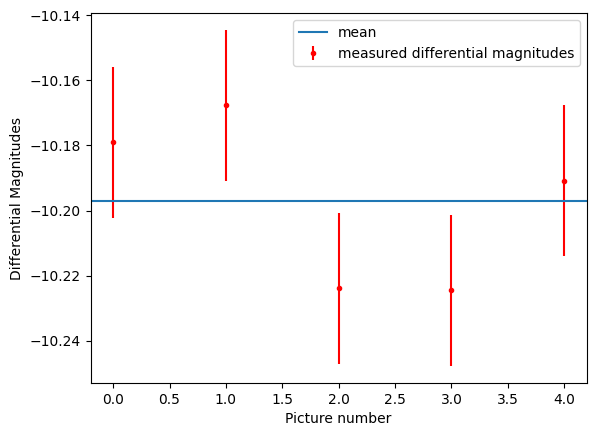

In [14]:
x= np.linspace(0,(len(diff_magnitude_list))-1, len(diff_magnitude_list))
plt.errorbar(x, diff_magnitude_list, yerr= np.std(diff_magnitude_list), linestyle = "None", marker = ".",color="r", label = "measured differential magnitudes")
plt.axhline(np.mean(diff_magnitude_list), label= "mean" )
plt.xlabel("Picture number")
plt.ylabel("Differential Magnitudes")
plt.legend()